In [1]:
using CSV, DataFrames, Dates, CategoricalArrays, Plots, Flux, Statistics

In [2]:
traindata = CSV.read("LSTM-Multivariate_pollution.csv", DataFrame)
traindata[!, :date] = DateTime.(traindata[!, :date], "yyyy-mm-dd HH:MM:SS")
traindata = traindata[!, Not(:date)] 

testdata = CSV.read("pollution_test_data1.csv", DataFrame)

function min_max_scale_columns(df::DataFrame, cols::Vector{String})::DataFrame
    df_scaled = copy(df)
    for col in cols
        if col in names(df_scaled)
            min_val = minimum(df_scaled[!, col])
            max_val = maximum(df_scaled[!, col])
            df_scaled[!, col] = Float64.(df_scaled[!, col]) # Convert to floating point if not already
            df_scaled[!, col] .= (df_scaled[!, col] .- min_val) ./ (max_val - min_val)
        end
    end
    return df_scaled
end

function preprocess(data)
    data[!, :wnd_dir] = categorical(data[!, :wnd_dir])
    data[!, :wnd_dir] = CategoricalArrays.levelcode.(data[!, :wnd_dir])
    data
    columns = ["pollution", "dew", "temp", "press", "wnd_dir", "wnd_spd", "snow", "rain"]
    data = min_max_scale_columns(data, columns)
    data[!, :snow] .= ifelse.(isnan.(data[!, :snow]), 0, data[!, :snow])
    data[!, :rain] .= ifelse.(isnan.(data[!, :rain]), 0, data[!, :rain])
    return data
end

traindata = preprocess(traindata)
testdata = preprocess(testdata)


Row,dew,temp,press,wnd_dir,wnd_spd,snow,rain,pollution
,Float64,Float64,Float64,Float64,Float64,Int64,Int64,Float64
1,0.52381,0.65,0.666667,0.666667,0.00710185,0,0,0.288288
2,0.47619,0.7,0.666667,0.666667,0.0162231,0,0,0.173423
3,0.52381,0.65,0.666667,0.666667,0.0202845,0,0,0.146396
4,0.52381,0.5,0.708333,1.0,0.000998344,0,0,0.177928
5,0.619048,0.45,0.708333,0.0,0.00304041,0,0,0.209459
6,0.571429,0.35,0.75,0.0,0.00710185,0,0,0.234234
7,0.571429,0.3,0.75,1.0,0.000998344,0,0,0.454955
8,0.619048,0.25,0.791667,1.0,0.00301772,0,0,0.551802
9,0.619048,0.3,0.791667,1.0,0.0050371,0,0,0.506757


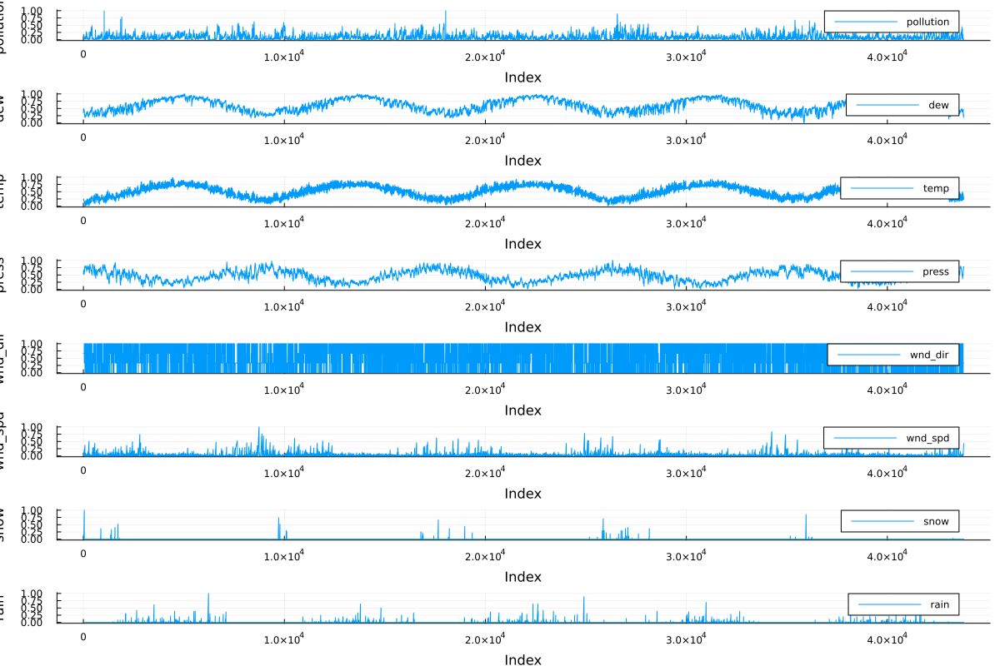

In [3]:
values = Matrix(traindata)
groups = 1:8
plts = []
for group in groups
    p = plot(values[:, group], label=names(traindata)[group], legend=:topright, ylabel=String(names(traindata)[group]))
    push!(plts, p)
end
plot(plts..., layout=(length(groups), 1), size=(1200, 800), xlabel="Index")

In [4]:
trainX = traindata[1:end-1, :]
trainY = traindata.pollution[2:end]

testX = testdata[1:end-1, :]
testY = testdata.pollution[2:end]

println("Train size X: ", size(trainX), ", Y: ", length(trainY))
println("Test size X: ", size(testX), ", Y: ", length(testY))

trainData = []
for i in range(start=1, stop=size(trainX, 1), step=1)
    push!(trainData, (Vector{Float32}(trainX[i, :]), [Float32(trainY[i])]))
end
testData = []
for i in range(start=1, stop=size(testX, 1), step=1)
    push!(testData, (Vector{Float32}(trainX[i, :]), [Float32(testY[i])]))
end


Train size X: (43799, 8), Y: 43799
Test size X: (345, 8), Y: 345


In [9]:
function train!(model, traindata, loss, opt, testdata)
    trainlosses = []
    testlosses = []
    start = time()
    for epoch in 1:500
        if epoch % 100 == 0
            println("$epoch epochs")
        end
        Flux.train!(loss, Flux.params(model), traindata, opt)
        push!(trainlosses, mean([loss(x, y) for (x, y) in traindata]))
        push!(testlosses, mean([loss(x, y) for (x, y) in testdata]))
    end
    endtime = time() 
    return model, trainlosses, testlosses, endtime - start
end


train! (generic function with 1 method)

In [10]:
function FFmodels(num)
    if num == 1
        model = Chain(
            Dense(8, 8, leakyrelu),
            Dense(8, 1, sigmoid) 
        )
        return model
    elseif num == 2
        model = Chain(
            Dense(8, 16, leakyrelu),
            Dense(16, 1, sigmoid)
        )
        return model
    elseif num == 3
        model = Chain(
            Dense(8, 8, leakyrelu),
            Dense(8, 4, leakyrelu),
            Dense(4, 1, sigmoid)
        )
        return model
    else
        return nothing
    end
end

FFplts = []
FFModels = []
FFtimes = []
for num in 1:3
    opt = ADAM()
    println("model - $num")
    model = FFmodels(num)
    loss(x, y) = Flux.Losses.mse(model(x), y)
    trainedmodel, trainlosses, testlosses, totTime = train!(model, trainData, loss, opt, testData)
    if num == 1
        t = "h-h-1"
    elseif num == 2
        t = "h-(2h)-1"
    else
        t = "h-h-(h/2)-1"
    end
    ptrain = plot(1:500, trainlosses, xlabel = "epochs", ylabel = "Loss", title = "Train Loss ($t)", label="Train loss")
    push!(FFplts, ptrain)
    ptest = plot(1:500, testlosses, xlabel = "epochs", ylabel = "Loss", title = "Test Loss ($t)", label = "Test loss")
    push!(FFplts, ptest)
    push!(FFModels, trainedmodel)
    push!(FFtimes, totTime)
end


model - 1


100 epochs


200 epochs


300 epochs


400 epochs


500 epochs


model - 2


100 epochs


200 epochs


300 epochs


400 epochs


500 epochs


model - 3


100 epochs


200 epochs


300 epochs


400 epochs


500 epochs


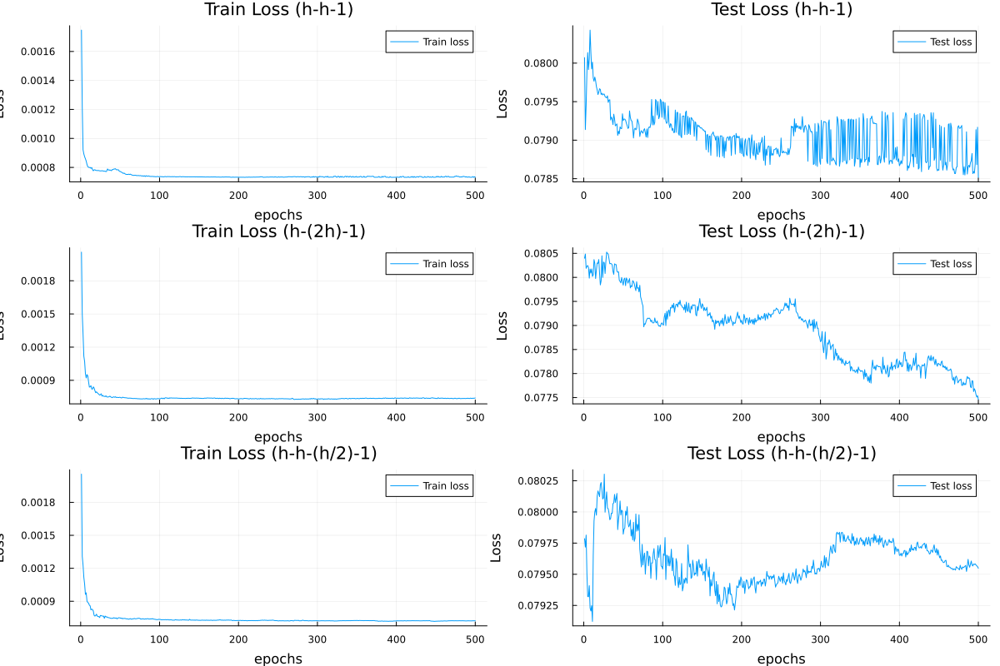

In [11]:
plot(FFplts..., layout=(3, 2), size=(1200, 800))

In [12]:
function LSTMmodels(num)
    if num == 1
        model = Chain(
            LSTM(8, 1),
        )
        return model
    elseif num == 2
        model = Chain(
            LSTM(8, 16),
            Dense(16, 1, sigmoid)
        )
        return model
    elseif num == 3
        model = Chain(
            LSTM(8, 8),
            LSTM(8, 4),
            Dense(4, 1, sigmoid)
        )
        return model
    else
        return nothing
    end
end

LSTMplts = []
LSTMModels = []
LSTMtimes = []
for num in 1:3
    opt = ADAM()
    println("model - $num")
    model = LSTMmodels(num)
    loss(x, y) = Flux.Losses.mse(model(x), y)
    trainedmodel, trainlosses, testlosses, totTime = train!(model, trainData, loss, opt, testData)
    if num == 1
        t = "h-h-1"
    elseif num == 2
        t = "h-(2h)-1"
    else
        t = "h-h-(h/2)-1"
    end
    ptrain = plot(1:500, trainlosses, xlabel = "epochs", ylabel = "Loss", title = "Train Loss ($t)", label="Train loss")
    ptest = plot(1:500, testlosses, xlabel = "epochs", ylabel = "Loss", title = "Test Loss ($t)", label="Test loss")
    push!(LSTMplts, ptrain)
    push!(LSTMplts, ptest)
    push!(LSTMModels, trainedmodel)
    push!(LSTMtimes, totTime)
end

model - 1


100 epochs


200 epochs


300 epochs


400 epochs


500 epochs


model - 2


100 epochs


200 epochs


300 epochs


400 epochs


500 epochs


model - 3


100 epochs


200 epochs


300 epochs


400 epochs


500 epochs


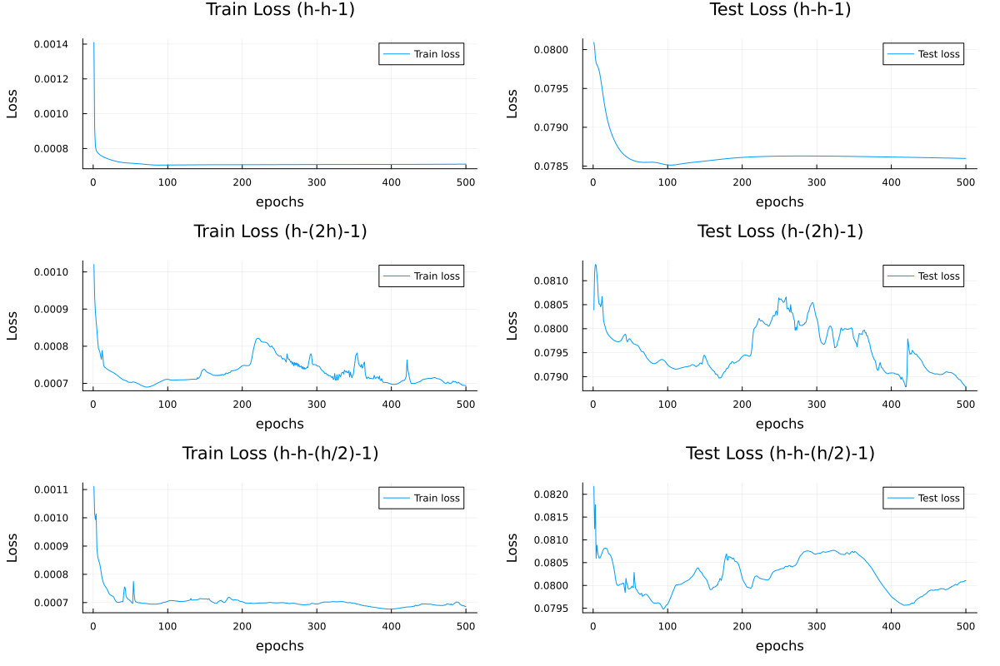

In [13]:
plot(LSTMplts..., layout=(3, 2), margin=5*Plots.mm, size=(1200, 800))

In [15]:
function GRUmodels(num)
    if num == 1
        model = Chain(
            GRU(8, 1),
        )
        return model
    elseif num == 2
        model = Chain(
            GRU(8, 16),
            Dense(16, 1, sigmoid)
        )
        return model
    elseif num == 3
        model = Chain(
            GRU(8, 8),
            GRU(8, 4),
            Dense(4, 1, sigmoid)
        )
        return model
    else
        return nothing
    end
end

GRUplts = []
GRUModels = []
GRUtimes = []
for num in 1:3
    opt = ADAM()
    println("model - $num")
    model = GRUmodels(num)
    loss(x, y) = Flux.Losses.mse(model(x), y)
    trainedmodel, trainlosses, testlosses, totTime = train!(model, trainData, loss, opt, testData)
    if num == 1
        t = "h-h-1"
    elseif num == 2
        t = "h-(2h)-1"
    else
        t = "h-h-(h/2)-1"
    end
    ptrain = plot(1:500, trainlosses, xlabel = "epochs", ylabel = "Loss", title = "Train Loss ($t)", label="Train loss")
    ptest = plot(1:500, testlosses, xlabel = "epochs", ylabel = "Loss", title = "Test Loss ($t)", label="Test loss")
    push!(GRUplts, ptrain)
    push!(GRUplts, ptest)
    push!(GRUModels, trainedmodel)
    push!(GRUtimes, totTime)
end
# 

model - 1


100 epochs


200 epochs


300 epochs


400 epochs


500 epochs


model - 2


100 epochs


200 epochs


300 epochs


400 epochs


500 epochs


model - 3


100 epochs


200 epochs


300 epochs


400 epochs


500 epochs


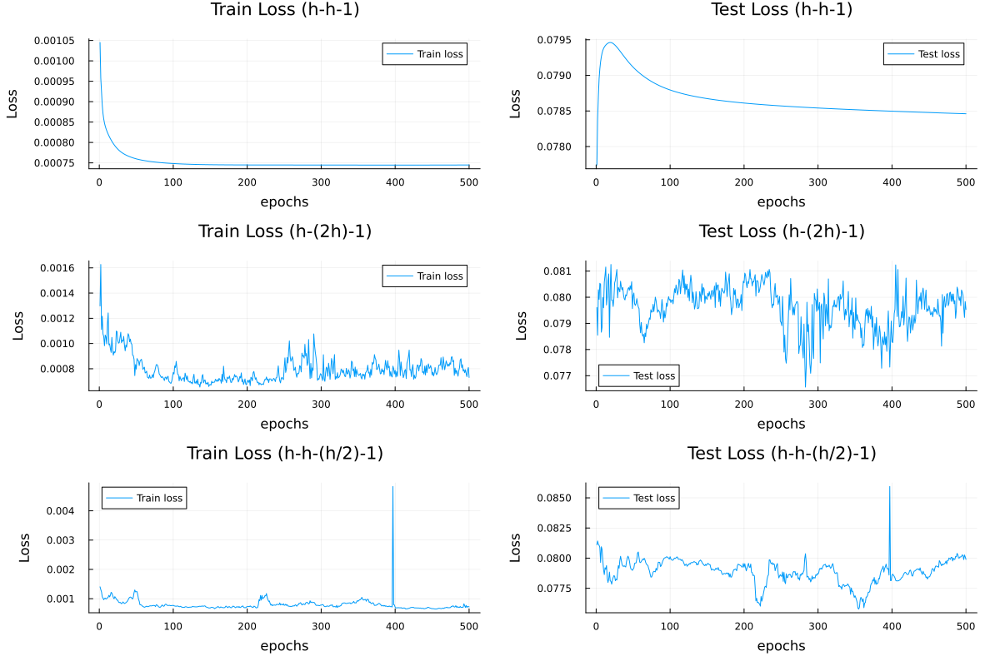

In [16]:
plot(GRUplts..., layout=(3, 2), margin=5*Plots.mm, size=(1200, 800))

In [17]:
FFtimes

3-element Vector{Any}:
 255.3489921092987
 271.0336899757385
 327.5071461200714

In [18]:
LSTMtimes

3-element Vector{Any}:
  664.5360460281372
 1001.7037088871002
 1370.5773282051086

In [19]:
GRUtimes

3-element Vector{Any}:
  711.7454919815063
 1147.3072528839111
 1432.2577888965607